<a href="https://colab.research.google.com/github/nileshmalode11/Machine-Learning/blob/main/Aus_whether_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
df = pd.read_csv('/content/drive/MyDrive/weatherAUS.csv.zip')

In [4]:
df.tail(50)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145410,2017-05-07,Uluru,10.8,27.0,0.0,NaN,NaN,ENE,44.0,ESE,...,31.0,17.0,1026.4,1022.5,NaN,NaN,16.8,26.3,No,No
145411,2017-05-08,Uluru,9.5,25.6,0.0,NaN,NaN,E,39.0,ENE,...,42.0,21.0,1025.6,1020.8,NaN,NaN,16.2,24.4,No,No
145412,2017-05-09,Uluru,8.3,22.9,0.0,NaN,NaN,E,31.0,E,...,49.0,25.0,1024.1,1020.4,NaN,NaN,14.2,21.9,No,No
145413,2017-05-10,Uluru,5.7,22.7,0.0,NaN,NaN,ENE,31.0,ESE,...,41.0,19.0,1023.2,1019.1,NaN,NaN,12.5,21.6,No,No
145414,2017-05-11,Uluru,4.1,24.7,0.0,NaN,NaN,E,26.0,ESE,...,33.0,17.0,1022.1,1017.2,NaN,NaN,13.4,23.7,No,No
145415,2017-05-12,Uluru,5.6,27.0,0.0,NaN,NaN,NNW,28.0,ESE,...,31.0,17.0,1018.8,1014.5,NaN,NaN,13.3,26.2,No,No
145416,2017-05-13,Uluru,6.8,28.7,0.0,NaN,NaN,NW,37.0,SE,...,43.0,19.0,1016.9,1014.6,NaN,1.0,15.2,27.5,No,No
145417,2017-05-14,Uluru,6.8,27.0,0.0,NaN,NaN,WNW,24.0,SSE,...,43.0,20.0,1018.9,1015.4,NaN,NaN,14.6,26.2,No,No
145418,2017-05-15,Uluru,5.3,28.2,0.0,NaN,NaN,WNW,39.0,SE,...,41.0,19.0,1017.5,1012.9,NaN,NaN,14.0,27.6,No,No
145419,2017-05-16,Uluru,6.4,29.6,0.0,NaN,NaN,NW,50.0,N,...,48.0,16.0,1014.5,1009.9,NaN,NaN,15.6,28.8,No,No


In [5]:
df.shape

(145460, 23)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [7]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [8]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64

In [9]:
df.drop(["Date"],axis=1,inplace=True)

In [10]:
df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

In [11]:
df['RainToday'].unique()

array(['No', 'Yes', nan], dtype=object)

In [12]:
#Exploring all numeric_features from dataframe.
numeric_feature=df.describe(include=float).columns
numeric_feature

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [13]:
#Exploring all numeric_features from dataframe.
categorical_feature=df.describe(include=object).columns
categorical_feature

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [14]:
#Creating new dataframe by cloning df dataframe.
df1=df.copy()

In [15]:
#Considering all features except the raintomorrow feature.
df1=df1.iloc[:,:-1]

In [16]:
a=[(i,index) for i,index in enumerate(df["RainTomorrow"]) if pd.isna(index)]
result = pd.DataFrame(a).set_index(0)

In [17]:
df1.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday'],
      dtype='object')

**Checking the correlation between features**

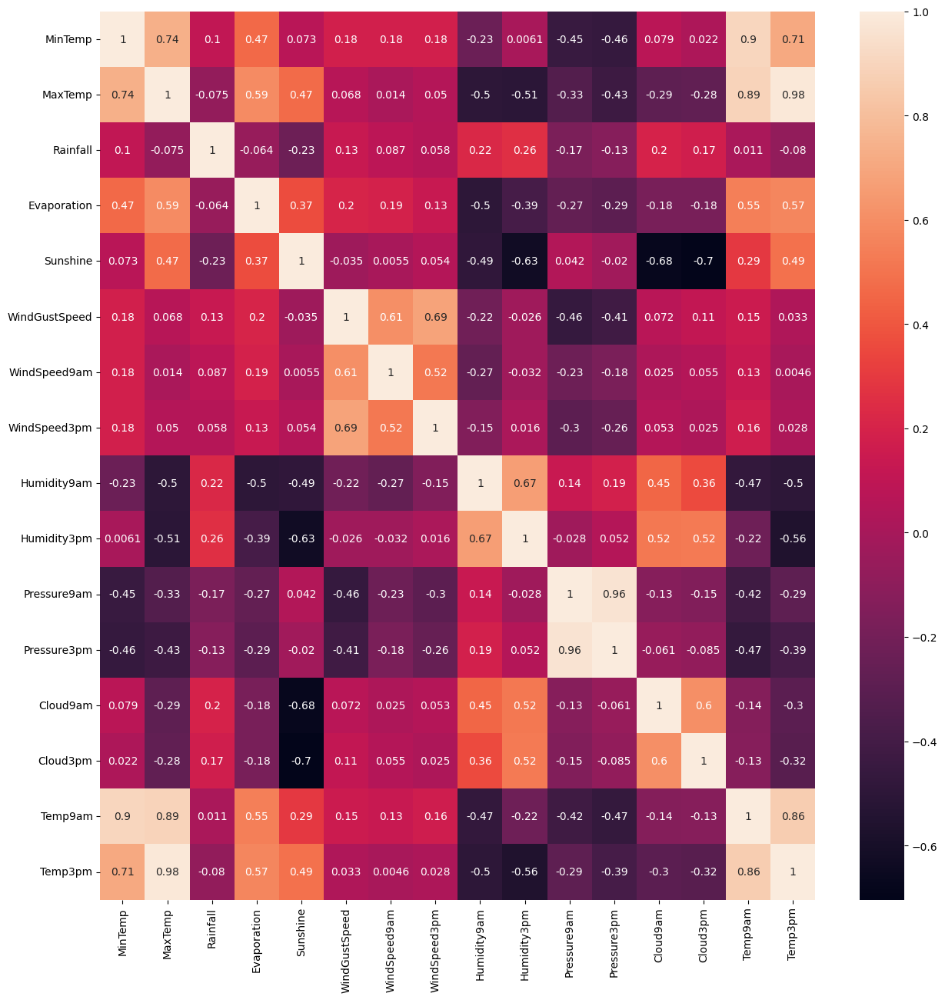

In [18]:
plt.figure(figsize=(15,15))
corr=df.corr()
sns.heatmap(corr,annot=True)
plt.show()

In [19]:
fig = px.histogram(df, x="WindDir9am",text_auto=True)
fig.show()

In [20]:
fig = px.histogram(df, x="WindGustDir",text_auto=True)
fig.show()

In [21]:
fig = px.histogram(df, x="WindGustDir",color="RainToday",text_auto=True)
fig.show()

In [22]:
fig = px.histogram(df, x="WindDir9am",color="RainToday",text_auto=True)
fig.show()

In [23]:
fig = px.histogram(df, x="WindDir3pm",text_auto=True)
fig.show()

In [24]:
fig = px.histogram(df, x="WindDir3pm",color="RainToday",text_auto=True)
fig.show()

In [25]:
fig = px.histogram(df, x="Location",color="WindDir3pm",
             pattern_shape="RainToday", pattern_shape_sequence=["+", "x"])
fig.show()

In [26]:
fig = px.histogram(df,x="Location", y="MinTemp", color="RainToday", title="Weather", pattern_shape="RainTomorrow",template="simple_white",pattern_shape_sequence=["+", "x"])
fig.show()

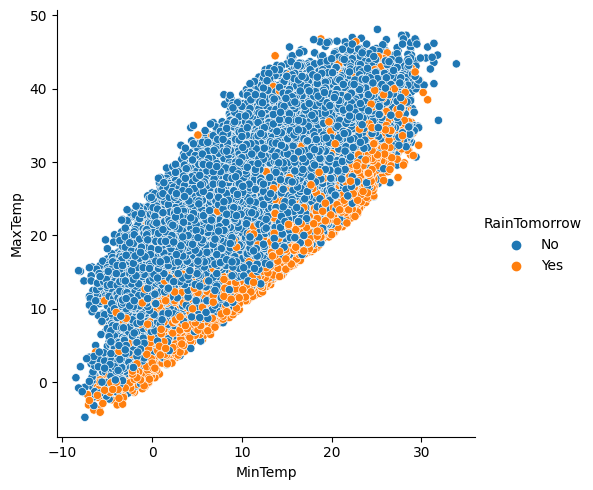

In [27]:
sns.relplot(x='MinTemp', y = 'MaxTemp', hue = "RainTomorrow", data = df)

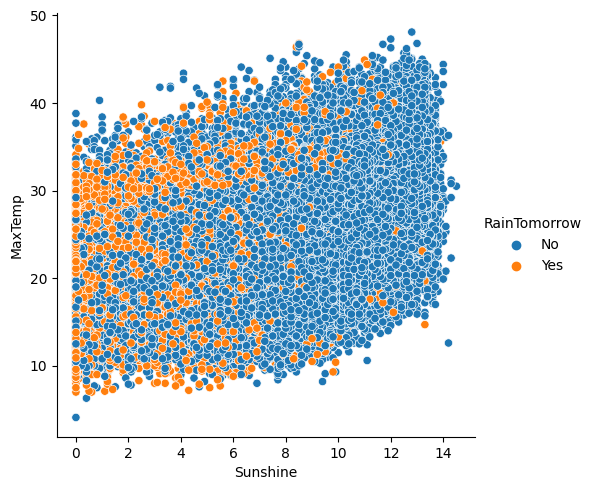

In [28]:
sns.relplot(x='Sunshine', y = 'MaxTemp', hue = "RainTomorrow", data = df)

In [29]:
fig = px.box(df,y="MaxTemp",color="RainTomorrow",title="",template="simple_white")
fig.show()


In [30]:
fig = px.box(df,y="MinTemp",color="RainTomorrow",title="MinTemp",template="simple_white")
fig.show()

**Missing value Treatement**

In [31]:
#Exploring the sum of all null values in df1 dataframe.
df1.isnull().sum()

Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
dtype: int64

<Axes: >

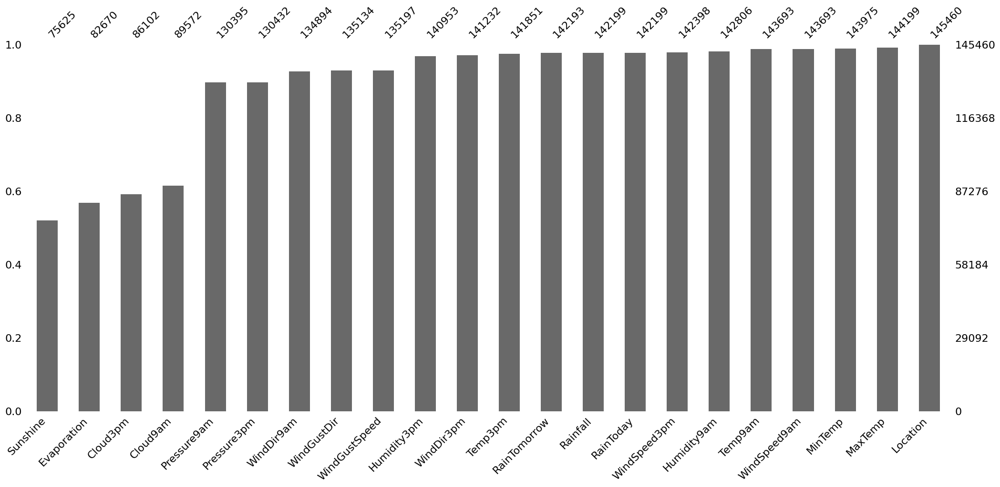

In [32]:
import missingno as msno

msno.bar(df, sort='ascending')

***Extracting the inferace data***

In [33]:
t=pd.DataFrame(a).set_index(0)
t.head()

,1
0,
14,NaN
283,NaN
435,NaN
437,NaN
443,NaN


In [34]:
index_nan=t.index.tolist()
index_nan

[14,
 283,
 435,
 437,
 443,
 452,
 455,
 464,
 611,
 983,
 984,
 985,
 986,
 1013,
 1374,
 1529,
 1530,
 1531,
 1685,
 1922,
 2031,
 2032,
 2033,
 2042,
 2913,
 2934,
 2942,
 2943,
 2944,
 3201,
 3211,
 3316,
 3338,
 3339,
 3384,
 3411,
 3412,
 3428,
 3433,
 3438,
 3446,
 3447,
 3452,
 3457,
 3462,
 3471,
 3472,
 3482,
 3517,
 3524,
 3525,
 3526,
 3529,
 3530,
 3532,
 3539,
 3542,
 3549,
 3552,
 3576,
 3584,
 3595,
 3629,
 3634,
 3639,
 3692,
 3760,
 3955,
 4044,
 4050,
 4131,
 4344,
 4345,
 4629,
 4644,
 4656,
 4845,
 4900,
 4911,
 4912,
 4935,
 4938,
 4939,
 5056,
 5079,
 5149,
 5393,
 5458,
 5459,
 5460,
 5461,
 5462,
 5841,
 5842,
 5843,
 5844,
 5845,
 5846,
 5847,
 5848,
 5849,
 5850,
 5851,
 5852,
 5853,
 5854,
 5855,
 5856,
 5857,
 5876,
 6294,
 6968,
 6969,
 6970,
 7446,
 7447,
 8529,
 8530,
 8588,
 8838,
 8839,
 8840,
 8841,
 8842,
 8843,
 8847,
 8848,
 8849,
 8904,
 8905,
 8906,
 9147,
 10238,
 10448,
 10534,
 10816,
 10820,
 10821,
 10822,
 10920,
 10921,
 10922,
 10923,
 1

In [35]:
df1_inference=df1.iloc[index_nan]
df1_inference
     

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
14,Albury,8.4,24.6,0.0,NaN,NaN,NaN,NaN,S,WNW,...,30.0,57.0,32.0,1009.7,1008.7,NaN,NaN,15.9,23.5,No
283,Albury,2.6,NaN,0.0,NaN,NaN,NaN,NaN,E,WNW,...,13.0,71.0,55.0,1017.8,1017.6,NaN,6.0,9.7,14.3,No
435,Albury,22.1,35.1,0.0,NaN,NaN,NaN,NaN,ENE,SW,...,11.0,58.0,37.0,1020.9,1017.8,NaN,1.0,26.9,33.5,No
437,Albury,21.5,35.0,0.0,NaN,NaN,NaN,NaN,SSE,E,...,7.0,76.0,35.0,1015.8,1010.3,NaN,8.0,24.2,33.1,No
443,Albury,15.5,30.6,0.0,NaN,NaN,NaN,NaN,SE,SSW,...,11.0,66.0,30.0,1015.9,1013.8,NaN,NaN,19.4,30.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144955,Uluru,22.5,37.7,0.0,NaN,NaN,SE,50.0,SE,ESE,...,26.0,22.0,11.0,1012.6,1009.6,NaN,NaN,28.8,37.2,No
145091,Uluru,12.3,19.1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,79.0,62.0,1016.8,1014.1,8.0,8.0,15.6,18.9,No
145092,Uluru,14.2,18.7,NaN,NaN,NaN,NaN,NaN,W,NaN,...,NaN,81.0,67.0,1015.2,1014.6,8.0,8.0,16.6,17.5,NaN
145335,Uluru,13.5,NaN,0.0,NaN,NaN,NaN,NaN,ENE,SW,...,7.0,23.0,11.0,1013.7,1008.4,NaN,NaN,25.2,34.4,No


In [36]:
#Creating list of all non null values in the target variable for spliting in train and test data.
a=[]
for i in range(df1.shape[0]):
  if i not in index_nan:
    a.append(i)

**Separating known data**

In [37]:
df_Known_data=df.iloc[a]
df_Known_data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


**Missing value treatment on known data**

In [38]:
#Using ffill and bfill method togethor to treat missing values in the dataframe.
df1=df1.fillna(method="bfill",axis=0).fillna(method="ffill",axis=0)
df1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,Albury,13.4,22.9,0.6,12.0,12.3,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.0,2.0,16.9,21.8,No
1,Albury,7.4,25.1,0.0,12.0,12.3,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,7.0,2.0,17.2,24.3,No
2,Albury,12.9,25.7,0.0,12.0,12.3,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No
3,Albury,9.2,28.0,0.0,12.0,12.3,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,7.0,8.0,18.1,26.5,No
4,Albury,17.5,32.3,1.0,12.0,12.3,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,Uluru,2.8,23.4,0.0,10.0,10.7,E,31.0,SE,ENE,...,11.0,51.0,24.0,1024.6,1020.3,3.0,2.0,10.1,22.4,No
145456,Uluru,3.6,25.3,0.0,10.0,10.7,NNW,22.0,SE,N,...,9.0,56.0,21.0,1023.5,1019.1,3.0,2.0,10.9,24.5,No
145457,Uluru,5.4,26.9,0.0,10.0,10.7,N,37.0,SE,WNW,...,9.0,53.0,24.0,1021.0,1016.8,3.0,2.0,12.5,26.1,No
145458,Uluru,7.8,27.0,0.0,10.0,10.7,SE,28.0,SSE,N,...,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No


In [39]:
#Exploring random samples from dataframe.
df1.sample(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
28344,Richmond,15.0,23.6,0.0,5.0,0.0,NE,13.0,NNE,SW,...,7.0,100.0,88.0,1014.5,1011.0,8.0,8.0,16.5,20.7,No
69952,Melbourne,14.4,17.0,9.8,5.0,4.7,SW,39.0,SW,SSE,...,20.0,59.0,50.0,1006.9,1011.0,2.0,6.0,15.4,15.6,Yes
59972,Bendigo,16.5,32.3,0.0,6.6,11.5,N,65.0,ESE,NW,...,9.0,58.0,40.0,1022.6,1018.1,1.0,8.0,21.5,30.4,No
47080,Canberra,12.7,33.5,0.0,6.4,9.9,WNW,31.0,N,E,...,4.0,58.0,29.0,1017.2,1013.9,7.0,1.0,21.7,32.1,No
22076,NorfolkIsland,14.3,19.2,0.0,5.2,8.0,WNW,46.0,WSW,WNW,...,31.0,46.0,58.0,1021.3,1018.3,1.0,4.0,17.6,17.9,No


**Splitting the know data for scaling**

In [40]:
x_known = df_Known_data.drop(['RainTomorrow'], axis = 1)

**Data Cleaning process**

In [41]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Evaporation    145460 non-null  float64
 5   Sunshine       145460 non-null  float64
 6   WindGustDir    145460 non-null  object 
 7   WindGustSpeed  145460 non-null  float64
 8   WindDir9am     145460 non-null  object 
 9   WindDir3pm     145460 non-null  object 
 10  WindSpeed9am   145460 non-null  float64
 11  WindSpeed3pm   145460 non-null  float64
 12  Humidity9am    145460 non-null  float64
 13  Humidity3pm    145460 non-null  float64
 14  Pressure9am    145460 non-null  float64
 15  Pressure3pm    145460 non-null  float64
 16  Cloud9am       145460 non-null  float64
 17  Cloud3pm       145460 non-nul

In [42]:
df1.shape

(145460, 21)

In [43]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Evaporation    145460 non-null  float64
 5   Sunshine       145460 non-null  float64
 6   WindGustDir    145460 non-null  object 
 7   WindGustSpeed  145460 non-null  float64
 8   WindDir9am     145460 non-null  object 
 9   WindDir3pm     145460 non-null  object 
 10  WindSpeed9am   145460 non-null  float64
 11  WindSpeed3pm   145460 non-null  float64
 12  Humidity9am    145460 non-null  float64
 13  Humidity3pm    145460 non-null  float64
 14  Pressure9am    145460 non-null  float64
 15  Pressure3pm    145460 non-null  float64
 16  Cloud9am       145460 non-null  float64
 17  Cloud3pm       145460 non-nul

In [44]:
df1.describe(include=object).columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'], dtype='object')

In [45]:
#Lebal encoding process
from sklearn import preprocessing
L_Encoder=preprocessing.LabelEncoder()

In [46]:
df1["Location"]=L_Encoder.fit_transform(df1["Location"])

In [47]:
df1.tail()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
145455,41,2.8,23.4,0.0,10.0,10.7,E,31.0,SE,ENE,...,11.0,51.0,24.0,1024.6,1020.3,3.0,2.0,10.1,22.4,No
145456,41,3.6,25.3,0.0,10.0,10.7,NNW,22.0,SE,N,...,9.0,56.0,21.0,1023.5,1019.1,3.0,2.0,10.9,24.5,No
145457,41,5.4,26.9,0.0,10.0,10.7,N,37.0,SE,WNW,...,9.0,53.0,24.0,1021.0,1016.8,3.0,2.0,12.5,26.1,No
145458,41,7.8,27.0,0.0,10.0,10.7,SE,28.0,SSE,N,...,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No
145459,41,14.9,27.0,0.0,10.0,10.7,SE,28.0,ESE,ESE,...,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No


In [48]:
import warnings
warnings.filterwarnings('ignore')

In [49]:
df1["WindGustDir"]=L_Encoder.fit_transform(df1["WindGustDir"])

In [50]:
df1["WindGustDir"].unique()

array([13, 14, 15,  4,  6,  3,  5, 12,  1, 10,  8,  7,  9,  2,  0, 11])

In [51]:
df1["WindDir9am"]=L_Encoder.fit_transform(df1["WindDir9am"])

In [52]:
df1["WindDir9am"].unique()

array([13,  6,  9,  1, 12, 10,  8,  4, 11,  3, 15,  2,  0,  7, 14,  5])

In [53]:
df1["WindDir3pm"]=L_Encoder.fit_transform(df1["WindDir3pm"])

In [54]:
df1["WindDir3pm"].unique()

array([14, 15,  0,  7, 13, 10,  2,  1,  6, 11, 12,  9,  3,  8,  5,  4])

In [55]:

df1["RainToday"]=L_Encoder.fit_transform(df1["RainToday"])

In [56]:
df1["RainToday"].unique()

array([0, 1])

In [57]:
# import module
from sklearn.preprocessing import StandardScaler
# compute required values
scaler =StandardScaler()
model1= scaler.fit(df1)
scaled_data1 = model1.transform(df1)
print(scaled_data1)

[[-1.53166617  0.18768921 -0.04233928 ... -0.00852232  0.01188926
  -0.54962405]
 [-1.53166617 -0.75151606  0.26677598 ...  0.0376222   0.37217149
  -0.54962405]
 [-1.53166617  0.10942211  0.35108015 ...  0.62211943  0.21364731
  -0.54962405]
 ...
 [ 1.20928479 -1.06458448  0.51968848 ... -0.6853086   0.6315747
  -0.54962405]
 [ 1.20928479 -0.68890237  0.53373917 ... -0.28538943  0.61716341
  -0.54962405]
 [ 1.20928479  0.42249053  0.53373917 ... -0.30077094 -0.11781234
  -0.54962405]]


<function matplotlib.pyplot.show(close=None, block=None)>

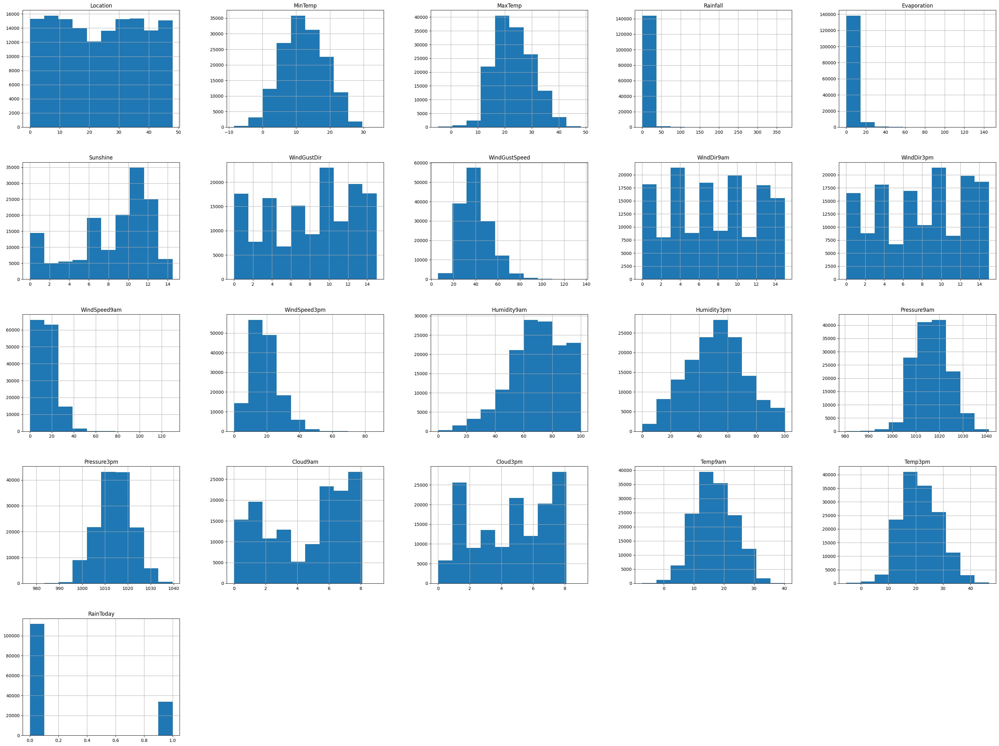

In [58]:
#Exploring data after use of StandardScaler
# plt.figure(figsize=(40,30))
df1.hist(figsize=(40,30))
plt.show

In [59]:
df["RainTomorrow"].shape

(145460,)

In [60]:
df["RainTomorrow"].notnull().sum()

142193

In [61]:
#Creating new dataframe by cloning df dataframe.
df1=df.copy()

In [62]:
a=[(i,index) for i,index in enumerate(df["RainTomorrow"]) if pd.isna(index)]
result = pd.DataFrame(a).set_index(0)

In [63]:
result

,1
0,
14,NaN
283,NaN
435,NaN
437,NaN
443,NaN
...,...
144955,NaN
145091,NaN
145092,NaN


In [64]:
#Exploring top five records of raintomorrow feature with nan values.
t=pd.DataFrame(a).set_index(0)
t.head()

,1
0,
14,NaN
283,NaN
435,NaN
437,NaN
443,NaN


In [65]:
#Convering the index which having nan values in the target variable.Converting this index in list.
index_nan=t.index.tolist()
index_nan

[14,
 283,
 435,
 437,
 443,
 452,
 455,
 464,
 611,
 983,
 984,
 985,
 986,
 1013,
 1374,
 1529,
 1530,
 1531,
 1685,
 1922,
 2031,
 2032,
 2033,
 2042,
 2913,
 2934,
 2942,
 2943,
 2944,
 3201,
 3211,
 3316,
 3338,
 3339,
 3384,
 3411,
 3412,
 3428,
 3433,
 3438,
 3446,
 3447,
 3452,
 3457,
 3462,
 3471,
 3472,
 3482,
 3517,
 3524,
 3525,
 3526,
 3529,
 3530,
 3532,
 3539,
 3542,
 3549,
 3552,
 3576,
 3584,
 3595,
 3629,
 3634,
 3639,
 3692,
 3760,
 3955,
 4044,
 4050,
 4131,
 4344,
 4345,
 4629,
 4644,
 4656,
 4845,
 4900,
 4911,
 4912,
 4935,
 4938,
 4939,
 5056,
 5079,
 5149,
 5393,
 5458,
 5459,
 5460,
 5461,
 5462,
 5841,
 5842,
 5843,
 5844,
 5845,
 5846,
 5847,
 5848,
 5849,
 5850,
 5851,
 5852,
 5853,
 5854,
 5855,
 5856,
 5857,
 5876,
 6294,
 6968,
 6969,
 6970,
 7446,
 7447,
 8529,
 8530,
 8588,
 8838,
 8839,
 8840,
 8841,
 8842,
 8843,
 8847,
 8848,
 8849,
 8904,
 8905,
 8906,
 9147,
 10238,
 10448,
 10534,
 10816,
 10820,
 10821,
 10822,
 10920,
 10921,
 10922,
 10923,
 1

In [66]:
df1_inference=df1.iloc[index_nan]
df1_inference

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
14,Albury,8.4,24.6,0.0,NaN,NaN,NaN,NaN,S,WNW,...,57.0,32.0,1009.7,1008.7,NaN,NaN,15.9,23.5,No,NaN
283,Albury,2.6,NaN,0.0,NaN,NaN,NaN,NaN,E,WNW,...,71.0,55.0,1017.8,1017.6,NaN,6.0,9.7,14.3,No,NaN
435,Albury,22.1,35.1,0.0,NaN,NaN,NaN,NaN,ENE,SW,...,58.0,37.0,1020.9,1017.8,NaN,1.0,26.9,33.5,No,NaN
437,Albury,21.5,35.0,0.0,NaN,NaN,NaN,NaN,SSE,E,...,76.0,35.0,1015.8,1010.3,NaN,8.0,24.2,33.1,No,NaN
443,Albury,15.5,30.6,0.0,NaN,NaN,NaN,NaN,SE,SSW,...,66.0,30.0,1015.9,1013.8,NaN,NaN,19.4,30.0,No,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144955,Uluru,22.5,37.7,0.0,NaN,NaN,SE,50.0,SE,ESE,...,22.0,11.0,1012.6,1009.6,NaN,NaN,28.8,37.2,No,NaN
145091,Uluru,12.3,19.1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,79.0,62.0,1016.8,1014.1,8.0,8.0,15.6,18.9,No,NaN
145092,Uluru,14.2,18.7,NaN,NaN,NaN,NaN,NaN,W,NaN,...,81.0,67.0,1015.2,1014.6,8.0,8.0,16.6,17.5,NaN,NaN
145335,Uluru,13.5,NaN,0.0,NaN,NaN,NaN,NaN,ENE,SW,...,23.0,11.0,1013.7,1008.4,NaN,NaN,25.2,34.4,No,NaN


In [67]:
#Creating list of all non null values in the target variable for spliting in train and test data.
a=[]
for i in range(df1.shape[0]):
  if i not in index_nan:
    a.append(i)

**Saperate the known data**

In [68]:
df_known_data=pd.DataFrame(df.iloc[a])
df_known_data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [69]:
df_known_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       142193 non-null  object 
 1   MinTemp        141556 non-null  float64
 2   MaxTemp        141871 non-null  float64
 3   Rainfall       140787 non-null  float64
 4   Evaporation    81350 non-null   float64
 5   Sunshine       74377 non-null   float64
 6   WindGustDir    132863 non-null  object 
 7   WindGustSpeed  132923 non-null  float64
 8   WindDir9am     132180 non-null  object 
 9   WindDir3pm     138415 non-null  object 
 10  WindSpeed9am   140845 non-null  float64
 11  WindSpeed3pm   139563 non-null  float64
 12  Humidity9am    140419 non-null  float64
 13  Humidity3pm    138583 non-null  float64
 14  Pressure9am    128179 non-null  float64
 15  Pressure3pm    128212 non-null  float64
 16  Cloud9am       88536 non-null   float64
 17  Cloud3pm       85099 non-null

**Missing value treatment on known data**

In [70]:
df_known_data=df_known_data.fillna(method="bfill",axis=0).fillna(method="ffill",axis=0)
df_known_data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,12.0,12.3,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,2.0,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,12.0,12.3,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,7.0,2.0,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,12.0,12.3,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,12.0,12.3,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,7.0,8.0,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,12.0,12.3,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,Uluru,3.5,21.8,0.0,6.4,10.7,E,31.0,ESE,E,...,59.0,27.0,1024.7,1021.2,3.0,2.0,9.4,20.9,No,No
145455,Uluru,2.8,23.4,0.0,6.4,10.7,E,31.0,SE,ENE,...,51.0,24.0,1024.6,1020.3,3.0,2.0,10.1,22.4,No,No
145456,Uluru,3.6,25.3,0.0,6.4,10.7,NNW,22.0,SE,N,...,56.0,21.0,1023.5,1019.1,3.0,2.0,10.9,24.5,No,No
145457,Uluru,5.4,26.9,0.0,6.4,10.7,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,3.0,2.0,12.5,26.1,No,No


**Splitting the data for scaling**

In [71]:
x_known = df_known_data.drop(['RainTomorrow'],axis=1)
y_known = df_known_data['RainTomorrow']

**Lable encoding on x features**

In [72]:
#Label encoding on known data
from sklearn import preprocessing
L_Encoder=preprocessing.LabelEncoder()
x_known["Location"]=L_Encoder.fit_transform(x_known["Location"])

In [73]:
x_known["Location"].unique()

array([ 2,  4, 10, 11, 21, 24, 26, 27, 30, 34, 37, 38, 42, 45, 47,  9, 40,
       23,  5,  6, 35, 19, 18, 20, 25, 33, 44, 12,  7,  8, 14, 39,  0, 22,
       28, 48,  1, 46, 29, 32, 31, 36, 43, 15, 17,  3, 13, 16, 41])

In [74]:
x_known['WindGustDir'] = L_Encoder.fit_transform(x_known['WindGustDir'])

In [75]:
x_known['WindDir9am'] = L_Encoder.fit_transform(x_known['WindDir9am'])

In [76]:
x_known['WindDir3pm'] = L_Encoder.fit_transform(x_known['WindDir3pm'])

In [77]:
x_known['RainToday'] = L_Encoder.fit_transform(x_known['RainToday'])

In [78]:
x_known.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2,13.4,22.9,0.6,12.0,12.3,13,44.0,13,14,...,24.0,71.0,22.0,1007.7,1007.1,8.0,2.0,16.9,21.8,0
1,2,7.4,25.1,0.0,12.0,12.3,14,44.0,6,15,...,22.0,44.0,25.0,1010.6,1007.8,7.0,2.0,17.2,24.3,0
2,2,12.9,25.7,0.0,12.0,12.3,15,46.0,13,15,...,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0
3,2,9.2,28.0,0.0,12.0,12.3,4,24.0,9,0,...,9.0,45.0,16.0,1017.6,1012.8,7.0,8.0,18.1,26.5,0
4,2,17.5,32.3,1.0,12.0,12.3,13,41.0,1,7,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0


**Scaling on known data**

In [79]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
model=scalar.fit(x_known)
x_known1=model.transform(x_known)
print(x_known1)

[[-1.5270045   0.18911965 -0.0462377  ... -0.00962269  0.00708313
  -0.54029965]
 [-1.5270045  -0.74794986  0.26286199 ...  0.03643231  0.36734324
  -0.54029965]
 [-1.5270045   0.11103052  0.3471619  ...  0.61979554  0.20882879
  -0.54029965]
 ...
 [ 1.21224943 -1.34142722  0.29096196 ... -0.93072252  0.39616405
  -0.54029965]
 [ 1.21224943 -1.06030637  0.51576173 ... -0.6850959   0.62673052
  -0.54029965]
 [ 1.21224943 -0.68547856  0.52981172 ... -0.28595264  0.61232012
  -0.54029965]]


In [80]:
x_known2 = pd.DataFrame(x_known1)
x_known2

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-1.527004,0.189120,-0.046238,-0.208836,1.007333,0.988472,1.124458,0.252956,1.262705,1.365994,...,0.603110,0.110669,-1.426876,-1.248296,-0.995458,1.223937,-0.981760,-0.009623,0.007083,-0.5403
1,-1.527004,-0.747950,0.262862,-0.278574,1.007333,0.988472,1.342470,0.252956,-0.285319,1.584221,...,0.375437,-1.301122,-1.282104,-0.852498,-0.900318,0.870879,-0.981760,0.036432,0.367343,-0.5403
2,-1.527004,0.111031,0.347162,-0.278574,1.007333,0.988472,1.560482,0.399278,1.262705,1.584221,...,0.830782,-1.614853,-1.040818,-1.261944,-0.777996,0.870879,-0.981760,0.619796,0.208829,-0.5403
3,-1.527004,-0.466829,0.670312,-0.278574,1.007333,0.988472,-0.837653,-1.210271,0.378120,-1.689182,...,-1.104434,-1.248833,-1.716420,0.102875,-0.220748,0.870879,1.278416,0.174597,0.684372,-0.5403
4,-1.527004,0.829450,1.274461,-0.162344,1.007333,0.988472,1.124458,0.033472,-1.391051,-0.161594,...,0.147765,0.685842,-0.896046,-0.825202,-1.144964,0.870879,1.278416,0.128542,1.145505,-0.5403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,1.212249,-1.357045,-0.200788,-0.278574,-0.075754,0.579957,-1.709703,-0.698141,-1.169904,-1.689182,...,-0.649089,-0.516794,-1.185590,1.071897,0.920929,-0.541352,-0.981760,-1.160997,-0.122611,-0.5403
142189,1.212249,-1.466370,0.024012,-0.278574,-0.075754,0.579957,-1.709703,-0.698141,0.378120,-1.470955,...,-0.876762,-0.935102,-1.330361,1.058249,0.798606,-0.541352,-0.981760,-1.053536,0.093546,-0.5403
142190,1.212249,-1.341427,0.290962,-0.278574,-0.075754,0.579957,-0.401629,-1.356593,0.378120,-1.034501,...,-1.104434,-0.673660,-1.475133,0.908119,0.635510,-0.541352,-0.981760,-0.930723,0.396164,-0.5403
142191,1.212249,-1.060306,0.515762,-0.278574,-0.075754,0.579957,-1.055666,-0.259174,0.378120,1.365994,...,-1.104434,-0.830525,-1.330361,0.566914,0.322908,-0.541352,-0.981760,-0.685096,0.626731,-0.5403


**Splitting the known data**

In [81]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(x_known2,y_known,random_state=0,test_size=0.20)

In [82]:
# train a logistic regression model on the training set
from sklearn.linear_model import LogisticRegression


# instantiate the model
lr = LogisticRegression(solver='liblinear', random_state=0)


# fit the model
lr.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [83]:
y_pred_train = lr.predict(X_train)

y_pred_train

array(['No', 'No', 'No', ..., 'No', 'No', 'Yes'], dtype=object)

**Probability prediction on known data**

In [84]:
# probability of getting output as 0 - no rain
lr.predict_proba(X_train)[:,0]

array([0.92000867, 0.66341033, 0.99521918, ..., 0.9370574 , 0.9920492 ,
       0.44736686])

In [85]:
# probability of getting output as 0 - rain
lr.predict_proba(X_train)[:,1]

array([0.07999133, 0.33658967, 0.00478082, ..., 0.0629426 , 0.0079508 ,
       0.55263314])

**Accuracy score of known data**

In [86]:
from sklearn.metrics import accuracy_score
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Model accuracy score: 0.8389


**Accuracy score on known teat data**

In [87]:
y_pred_test = lr.predict(X_test)

y_pred_test

array(['No', 'No', 'No', ..., 'No', 'No', 'Yes'], dtype=object)

In [88]:
from sklearn.metrics import accuracy_score
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Model accuracy score: 0.8389


**prediction on inferance data**

In [89]:
df1_inference.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
14,Albury,8.4,24.6,0.0,NaN,NaN,NaN,NaN,S,WNW,...,57.0,32.0,1009.7,1008.7,NaN,NaN,15.9,23.5,No,NaN
283,Albury,2.6,NaN,0.0,NaN,NaN,NaN,NaN,E,WNW,...,71.0,55.0,1017.8,1017.6,NaN,6.0,9.7,14.3,No,NaN
435,Albury,22.1,35.1,0.0,NaN,NaN,NaN,NaN,ENE,SW,...,58.0,37.0,1020.9,1017.8,NaN,1.0,26.9,33.5,No,NaN
437,Albury,21.5,35.0,0.0,NaN,NaN,NaN,NaN,SSE,E,...,76.0,35.0,1015.8,1010.3,NaN,8.0,24.2,33.1,No,NaN
443,Albury,15.5,30.6,0.0,NaN,NaN,NaN,NaN,SE,SSW,...,66.0,30.0,1015.9,1013.8,NaN,NaN,19.4,30.0,No,NaN


**Spliting inferance data**

In [91]:
x_inference = df1_inference.drop(['RainTomorrow'],axis = 1)
y_inference = df1_inference['RainTomorrow']

**Lable Encoding on inferance data**

In [94]:
#Label encoding on known data
from sklearn import preprocessing
L_Encoder=preprocessing.LabelEncoder()
x_inference["Location"]=L_Encoder.fit_transform(x_inference["Location"])

x_inference["WindGustDir"]=L_Encoder.fit_transform(x_inference["WindGustDir"])

x_inference["WindDir9am"]=L_Encoder.fit_transform(x_inference["WindDir9am"])

x_inference["WindDir3pm"]=L_Encoder.fit_transform(x_inference["WindDir3pm"])

x_inference["RainToday"]=L_Encoder.fit_transform(x_inference["RainToday"])


In [95]:
x_inference.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
14,2,8.4,24.6,0.0,NaN,NaN,16,NaN,8,14,...,30.0,57.0,32.0,1009.7,1008.7,NaN,NaN,15.9,23.5,0
283,2,2.6,NaN,0.0,NaN,NaN,16,NaN,0,14,...,13.0,71.0,55.0,1017.8,1017.6,NaN,6.0,9.7,14.3,0
435,2,22.1,35.1,0.0,NaN,NaN,16,NaN,1,12,...,11.0,58.0,37.0,1020.9,1017.8,NaN,1.0,26.9,33.5,0
437,2,21.5,35.0,0.0,NaN,NaN,16,NaN,10,0,...,7.0,76.0,35.0,1015.8,1010.3,NaN,8.0,24.2,33.1,0
443,2,15.5,30.6,0.0,NaN,NaN,16,NaN,9,11,...,11.0,66.0,30.0,1015.9,1013.8,NaN,NaN,19.4,30.0,0


**Missing value tratement on inference data**

In [98]:
x_inference=x_inference.fillna(method="bfill",axis=0).fillna(method="ffill",axis=0)
x_inference.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
14,2,8.4,24.6,0.0,6.4,0.0,16,28.0,8,14,...,30.0,57.0,32.0,1009.7,1008.7,6.0,6.0,15.9,23.5,0
283,2,2.6,35.1,0.0,6.4,0.0,16,28.0,0,14,...,13.0,71.0,55.0,1017.8,1017.6,6.0,6.0,9.7,14.3,0
435,2,22.1,35.1,0.0,6.4,0.0,16,28.0,1,12,...,11.0,58.0,37.0,1020.9,1017.8,6.0,1.0,26.9,33.5,0
437,2,21.5,35.0,0.0,6.4,0.0,16,28.0,10,0,...,7.0,76.0,35.0,1015.8,1010.3,6.0,8.0,24.2,33.1,0
443,2,15.5,30.6,0.0,6.4,0.0,16,28.0,9,11,...,11.0,66.0,30.0,1015.9,1013.8,6.0,1.0,19.4,30.0,0


**Scaling on inference data**

In [99]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
model=scalar.fit(x_inference)
x_inference1=model.transform(x_inference)
print(x_inference1)

[[-1.83604947 -0.37644162  0.42089382 ...  0.06989278  0.49797963
  -1.41568169]
 [-1.83604947 -1.22707146  1.92729804 ... -0.84064631 -0.86315775
  -1.41568169]
 [-1.83604947  1.63280473  1.92729804 ...  1.68536535  1.97747677
  -1.41568169]
 ...
 [ 1.05504262  0.47418823 -0.42556188 ...  0.17269558 -0.38971866
   0.82133504]
 [ 1.05504262  0.371526   -0.42556188 ...  1.43570141  2.11063152
  -1.41568169]
 [ 1.05504262  0.57685045 -0.42556188 ... -0.06228225  0.11331037
  -1.41568169]]


In [101]:
x_inference2=pd.DataFrame(x_inference1)

In [102]:
x_inference2

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-1.836049,-0.376442,0.420894,-0.37223,0.232543,-1.852555,1.041038,-0.911285,-0.223650,0.968545,...,1.174040,-0.967107,-1.004002,-1.233469,-1.088440,0.415128,0.564497,0.069893,0.497980,-1.415682
1,-1.836049,-1.227071,1.927298,-0.37223,0.232543,-1.852555,1.041038,-0.911285,-1.758660,0.968545,...,-0.668638,-0.153482,0.080009,-0.096915,0.220424,0.415128,0.564497,-0.840646,-0.863158,-1.415682
2,-1.836049,1.632805,1.927298,-0.37223,0.232543,-1.852555,1.041038,-0.911285,-1.566784,0.563782,...,-0.885424,-0.908991,-0.768348,0.338062,0.249837,0.415128,-1.376370,1.685365,1.977477,-1.415682
3,-1.836049,1.544809,1.912951,-0.37223,0.232543,-1.852555,1.041038,-0.911285,0.160102,-1.864798,...,-1.318995,0.137098,-0.862610,-0.377546,-0.853138,0.415128,1.340844,1.288840,1.918297,-1.415682
4,-1.836049,0.664847,1.281696,-0.37223,0.232543,-1.852555,1.041038,-0.911285,-0.031774,0.361400,...,-0.885424,-0.444062,-1.098264,-0.363514,-0.338417,0.415128,-1.376370,0.583907,1.459653,-1.415682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3262,1.055043,1.691469,2.300312,-0.37223,1.022158,0.301435,-0.286912,0.448463,-0.031774,-1.460034,...,0.740469,-3.001169,-1.993752,-0.826555,-0.956083,1.090874,1.340844,1.964402,2.524891,-1.415682
3263,1.055043,0.195534,-0.368175,-0.37223,1.022158,0.301435,1.041038,0.448463,1.311360,1.373308,...,-1.318995,0.311447,0.409925,-0.237230,-0.294298,1.090874,1.340844,0.025834,-0.182589,-1.415682
3264,1.055043,0.474188,-0.425562,-0.37223,1.022158,0.301435,1.041038,0.448463,0.735731,1.373308,...,-1.318995,0.427679,0.645580,-0.461735,-0.220766,1.090874,1.340844,0.172696,-0.389719,0.821335
3265,1.055043,0.371526,-0.425562,-0.37223,1.022158,0.301435,1.041038,0.448463,-1.566784,0.563782,...,-1.318995,-2.943053,-1.993752,-0.672208,-1.132558,1.090874,1.340844,1.435701,2.110632,-1.415682


In [105]:
# train a logistic regression model on the training set
from sklearn.linear_model import LogisticRegression


# instantiate the model
lr = LogisticRegression(solver='liblinear', random_state=0)


#fit the model
lr.fit(X_train,y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [108]:
y_pred_inference = lr.predict(x_inference2)

In [109]:
y_pred_train2=pd.DataFrame(y_pred_inference)
y_pred_train2

,0
0,No
1,No
2,No
3,No
4,No
...,...
3262,No
3263,No
3264,No
3265,No
